In [2]:
import numpy as np
import loompy
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import matplotlib.pyplot as plt
import glob
import bbknn
import seaborn as sns
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
from pandas.core.index import RangeIndex

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-08-04 11:14.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [3]:
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.5.0 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
sc.settings.set_figure_params(dpi=140)

In [ ]:
##### This is a continuation from Figure 1 ####

In [45]:
#####SUBSETTING THE DATA#####

In [46]:
adata_subset1 = adata[adata.obs['leiden'].isin(
    ['0 Contr&Smo22 Fibro','4 Contr Fibro1','6 Contr Fibro2'])]

In [47]:
adata_subset1

View of AnnData object with n_obs × n_vars = 1890 × 3430
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Time_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [48]:
sc.tl.pca(adata_subset1, svd_solver='arpack')

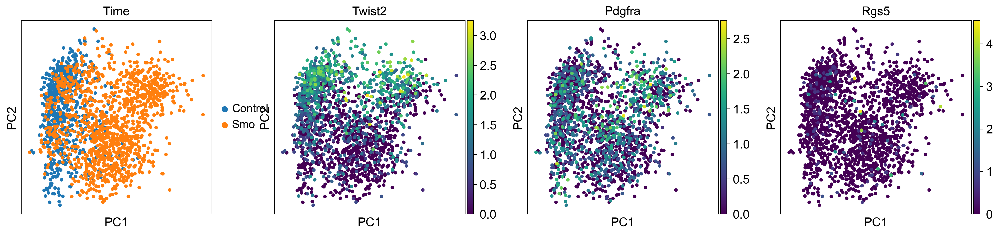

In [49]:
sc.pl.pca(adata_subset1, color=['Time','Twist2', 'Pdgfra', 'Rgs5'])

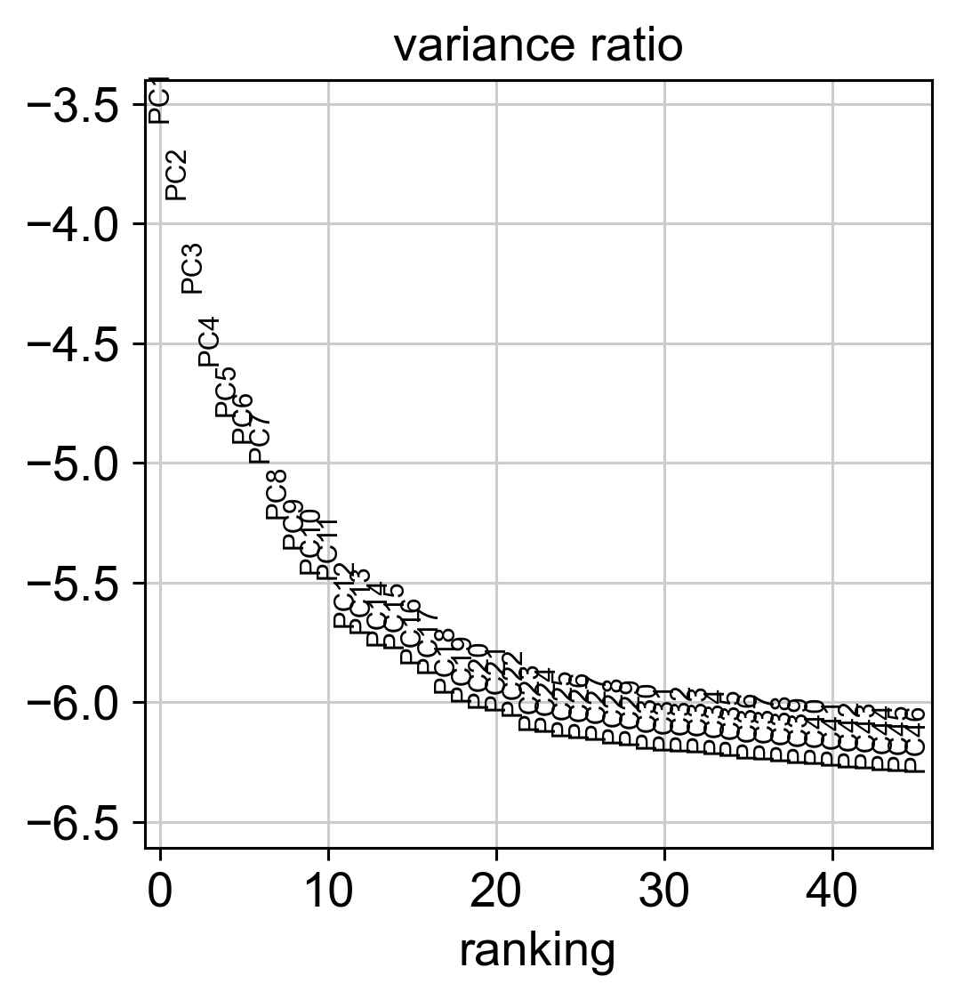

In [50]:
sc.pl.pca_variance_ratio(adata_subset1, n_pcs=45, log=True)

In [51]:
sc.pp.neighbors(adata_subset1, n_neighbors=15, n_pcs=40)

In [52]:
sc.tl.umap(adata_subset1, min_dist=0.1, spread=1)

In [53]:
sc.tl.leiden(adata_subset1, resolution=0.2)

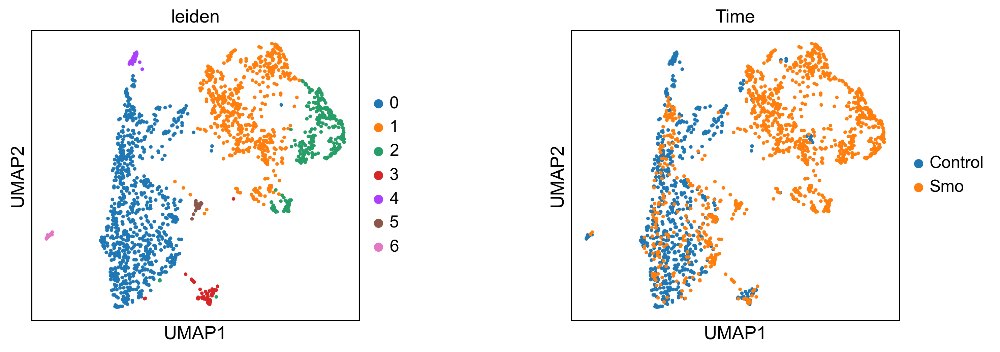

In [54]:
sc.pl.umap(adata_subset1, color=['leiden','Time'], legend_loc='right margin', wspace=0.5, size=30)

In [55]:
###SUBSET THE SUBSET####

In [56]:
adata_subset = adata_subset1[adata_subset1.obs['leiden'].isin(
    ['0','1','2','3','4','5'])]

In [57]:
sc.tl.leiden(adata_subset, resolution=1) ##main part was 0.4 resolution 

Trying to set attribute `.obs` of view, copying.


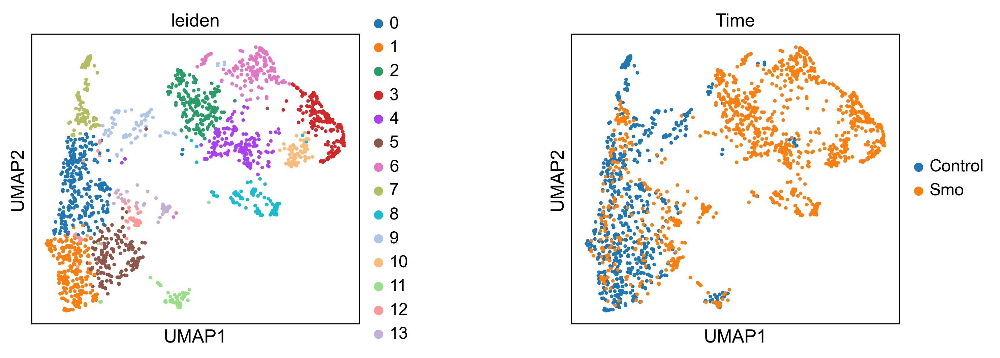

In [58]:
sc.pl.umap(adata_subset, color=['leiden','Time'], legend_loc='right margin', wspace=0.5, size=30)

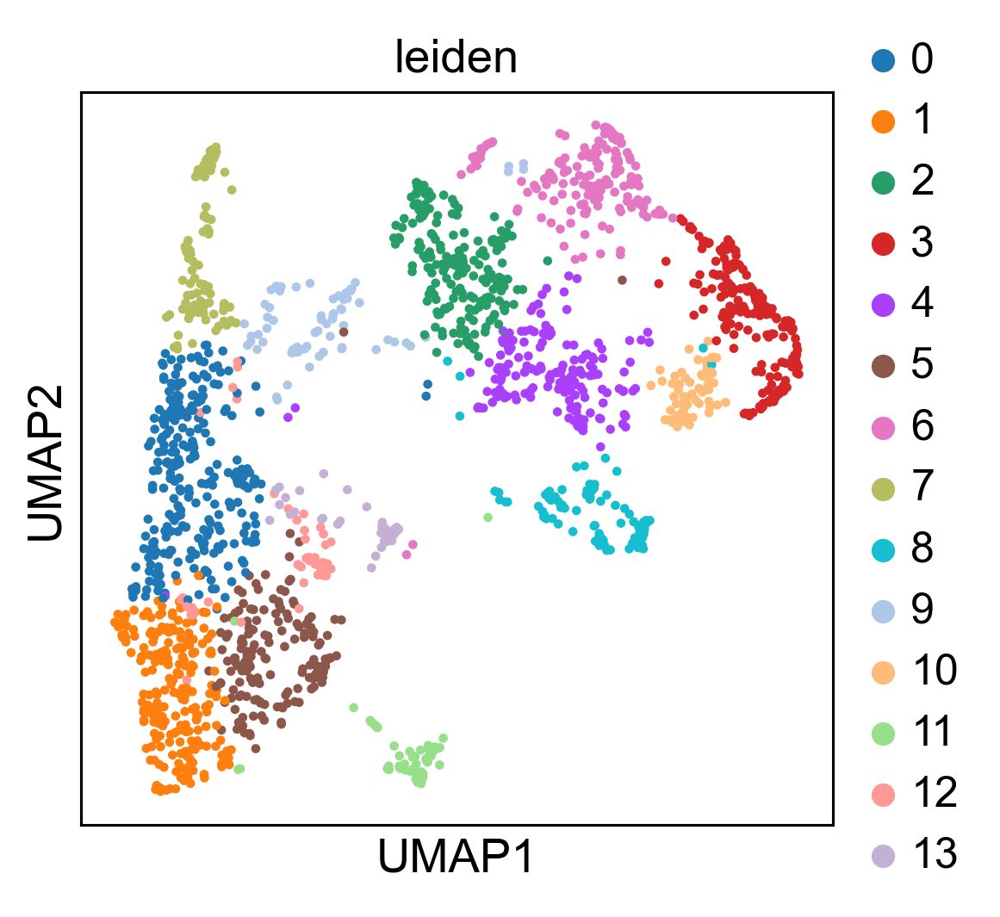

In [59]:
sc.pl.umap(adata_subset, color=['leiden'], legend_loc='right margin', wspace=0.5, size=30)

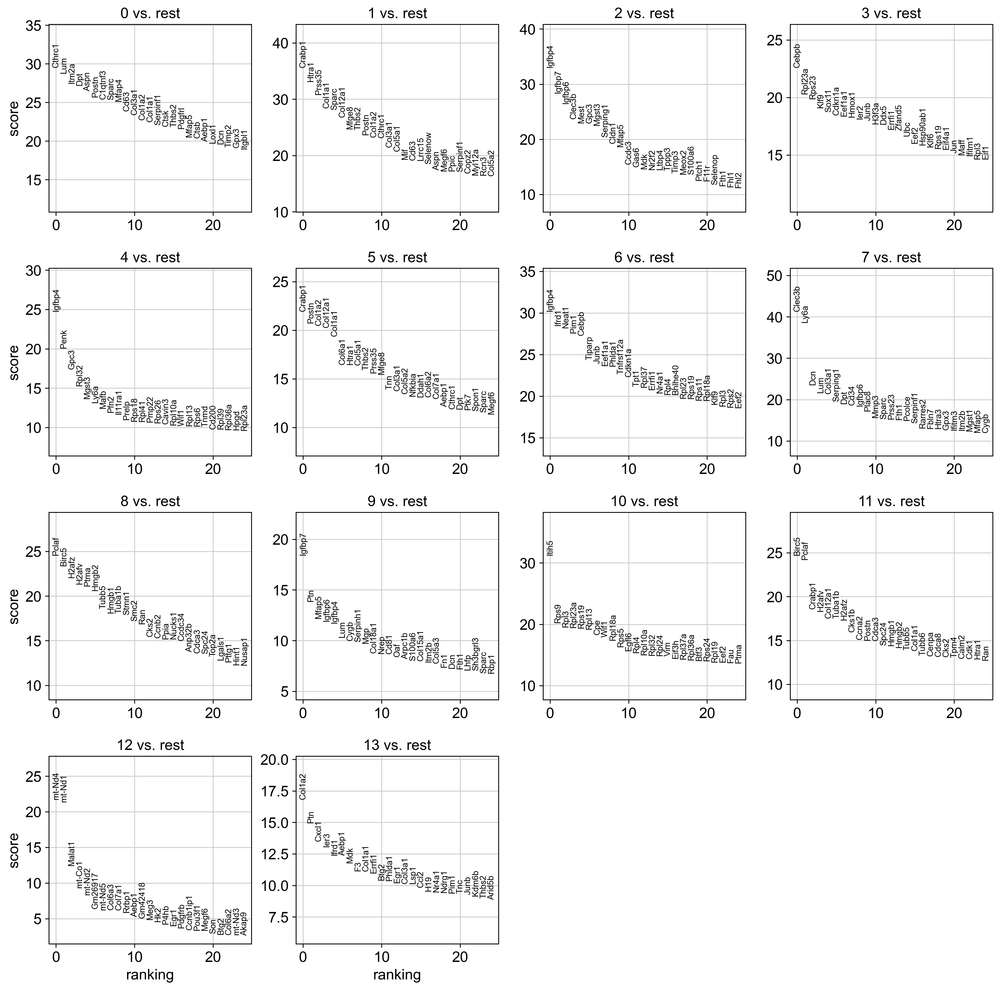

In [60]:
sc.tl.rank_genes_groups(adata_subset, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_subset, n_genes=25, sharey=False)

In [61]:
pd.DataFrame(adata_subset.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Cthrc1,Crabp1,Igfbp4,Cebpb,Igfbp4,Crabp1,Igfbp4,Clec3b,Pclaf,Igfbp7,Itih5,Birc5,mt-Nd4,Col1a2
1,Lum,Htra1,Igfbp7,Rpl23a,Penk,Postn,Ifrd1,Ly6a,Birc5,Ptn,Rps9,Pclaf,mt-Nd1,Ptn
2,Itm2a,Prss35,Igfbp6,Rps23,Gpc3,Col1a2,Neat1,Dcn,H2afz,Mfap5,Rpl3,Crabp1,Malat1,Cxcl1
3,Dpt,Col1a1,Clec3b,Klf9,Rpl32,Col12a1,Pim1,Lum,H2afv,Igfbp6,Rpl23a,H2afv,mt-Co1,Ier3
4,Aspn,Sparc,Mest,Sox11,Mgst3,Col1a1,Cebpb,Col3a1,Ptma,Igfbp4,Rps19,Col12a1,mt-Nd2,Ifrd1
5,Postn,Col12a1,Gpc3,Cdkn1a,Ly6a,Col6a1,Tiparp,Serping1,Hmgb2,Lum,Rpl13,Tuba1b,Gm26917,Aebp1
6,C1qtnf3,Mfge8,Mgst3,Eef1a1,Mafb,Htra1,Junb,Dpt,Tubb5,Cygb,Cpe,H2afz,mt-Nd5,Mdk
7,Sparc,Thbs2,Serping1,Hmox1,Pfn2,Col5a1,Eef1a1,Cd34,Hmgb1,Serpinh1,Wif1,Cks1b,Col6a3,F3
8,Mfap4,Postn,Cldn1,Ier2,Il11ra1,Thbs2,Phlda1,Igfbp6,Tuba1b,Mgp,Rpl18a,Ccna2,Col7a1,Col1a1
9,Cd63,Col1a2,Mfap5,Junb,Prelp,Prss35,Tnfrsf12a,Plac8,Stmn1,Col18a1,Rps5,Postn,Rrbp1,Errfi1


In [62]:
penkmarker_genes=['Igfbp4','Gpc3','Mgst3','Igfbp7','Penk','Ptch1',
                  'F11r','Cd200','Igfbp6','Mfap5','Cldn1','Ly6a',
                  'Tppp3','Prelp','Fxyd7','Hck','Pltp','Lgr4',
                  'S100a6','Selenop']

In [63]:
penk4markeg_genes=['Ifrd1','Cebpb','Neat1','Pim1','Phlda1','Junb','Errfi1',
                  'Tnfrsf12a','Nr4a1','Tpt1','Eef1a1','Tiparp','Cdkn1a',
                  'Bhlhe40','Myc','Trib1','Hk2','Klf9','Ier5','Ndrg1']

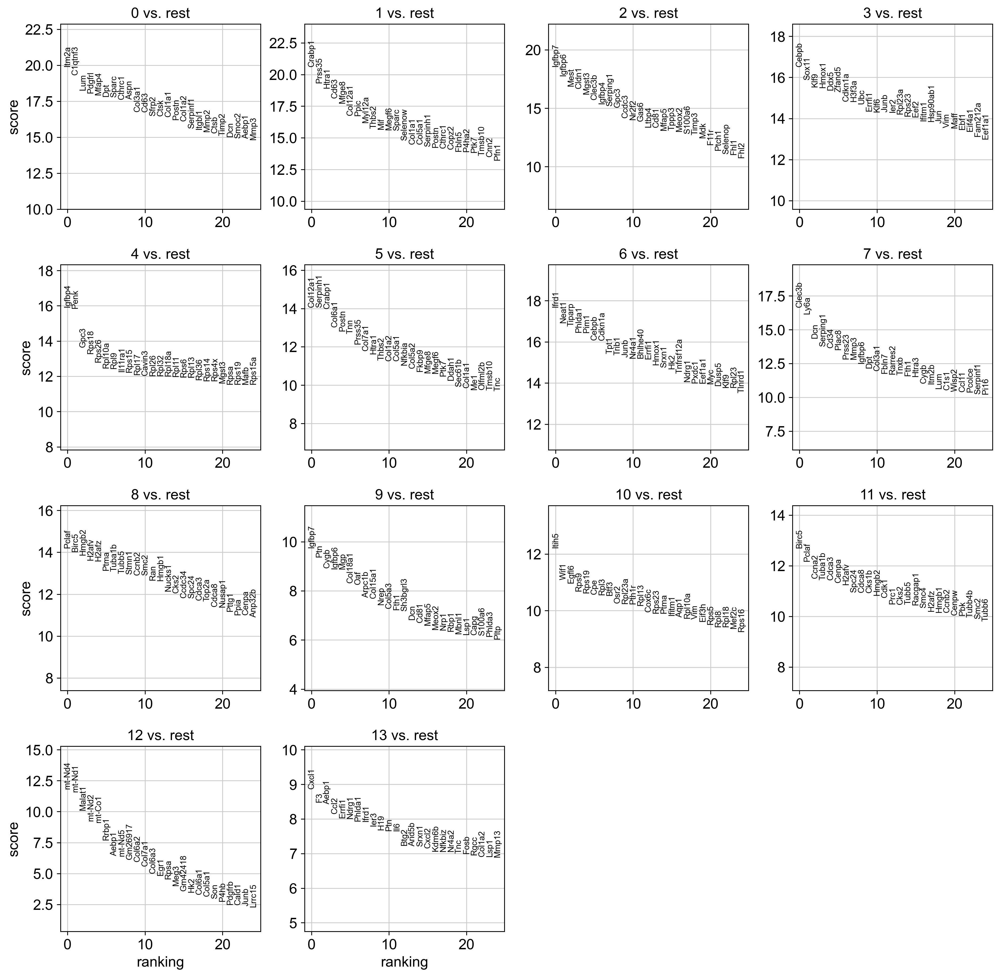

In [64]:
sc.tl.rank_genes_groups(adata_subset, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_subset, n_genes=25, sharey=False)

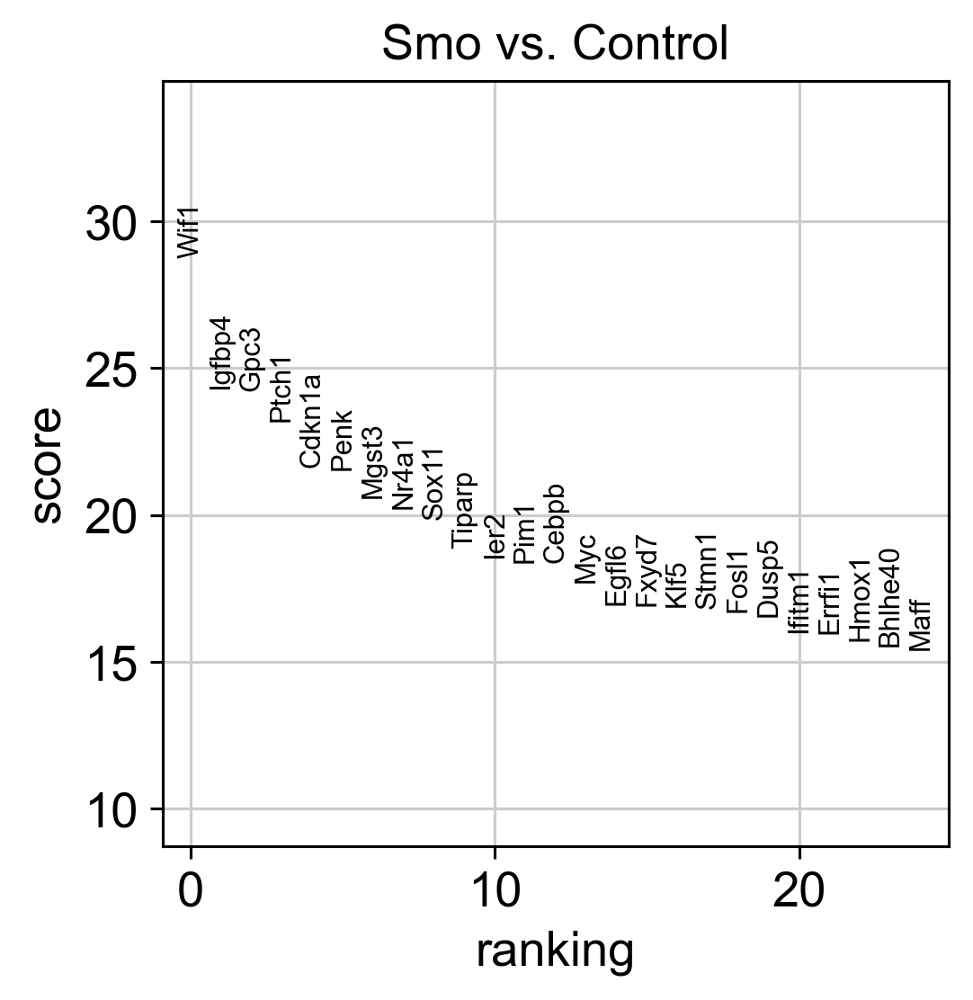

In [68]:
sc.tl.rank_genes_groups(adata_subset, 'Time', method='t-test',groups=['Smo'],reference='Control',key_added='smo_up',use_raw=False)
sc.pl.rank_genes_groups(adata_subset,key='smo_up',n_genes=25, sharey=False)

In [69]:
list_smo_up=pd.DataFrame(adata_subset.uns['smo_up']['names'])

In [70]:
print(list_smo_up['Smo'])

0       Wif1
1     Igfbp4
2       Gpc3
3      Ptch1
4     Cdkn1a
       ...  
95    S100a4
96      Areg
97      Dkk2
98     Ptgs2
99      Bmp3
Name: Smo, Length: 100, dtype: object


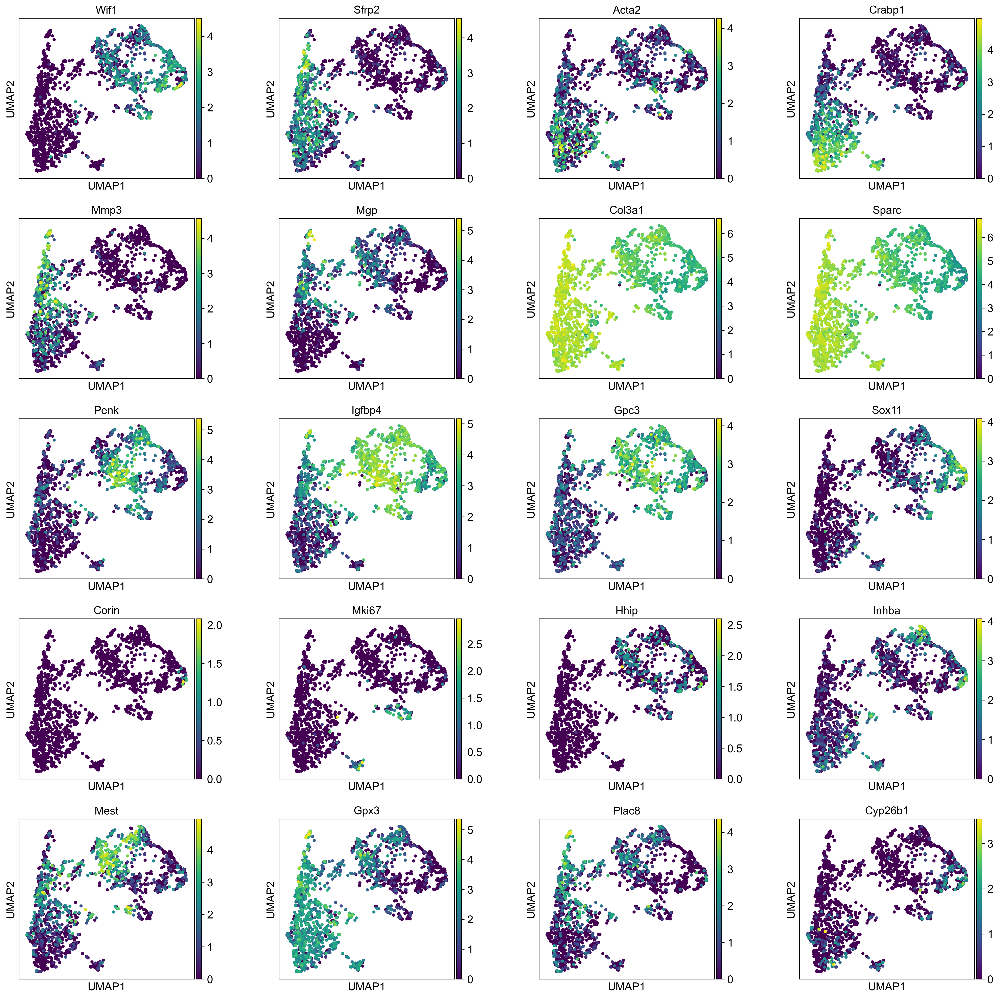

In [71]:
sc.pl.umap(adata_subset, color=['Wif1','Sfrp2','Acta2','Crabp1',
                               'Mmp3','Mgp','Col3a1','Sparc',
                               'Penk','Igfbp4','Gpc3','Sox11',
                               'Corin','Mki67','Hhip','Inhba',
                               'Mest','Gpx3','Plac8','Cyp26b1'], 
           color_map= 'viridis',
           wspace=0.35)

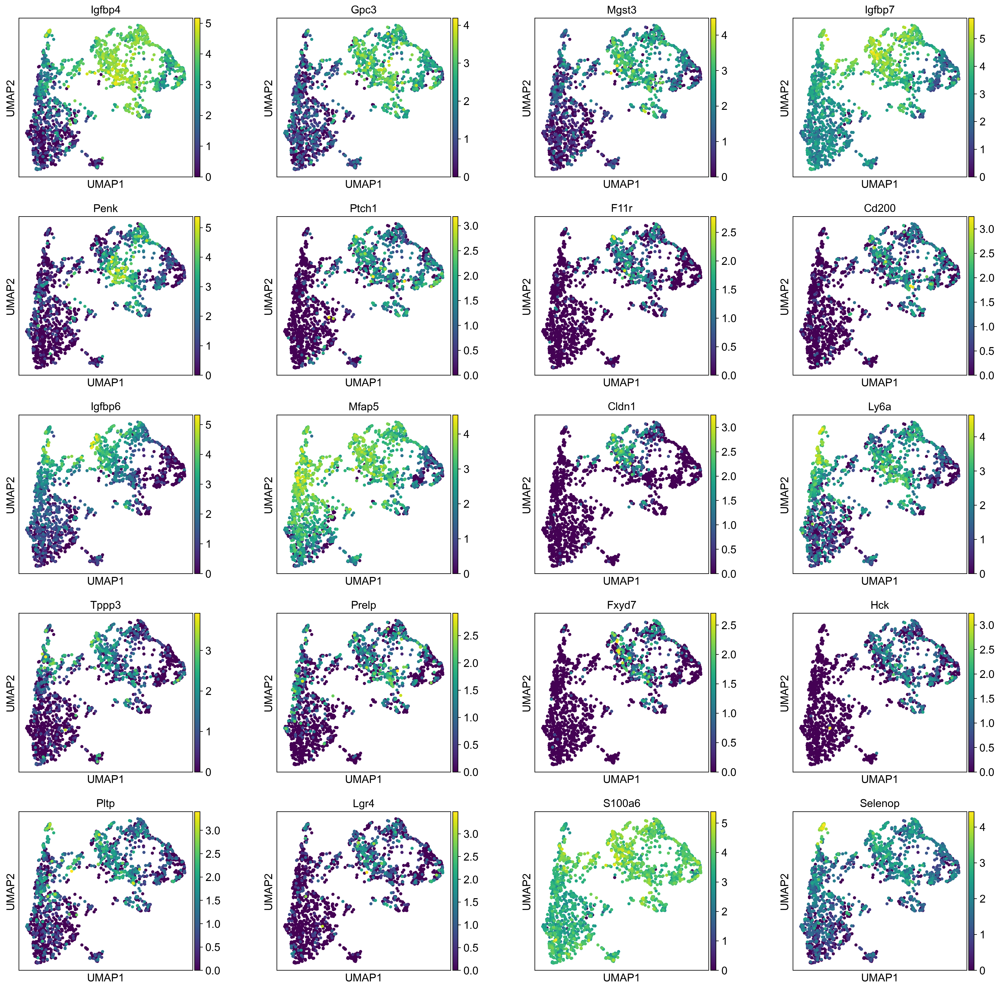

In [72]:
sc.pl.umap(adata_subset, color=penkmarker_genes, 
           color_map= 'viridis',
           wspace=0.35, vmin=0)

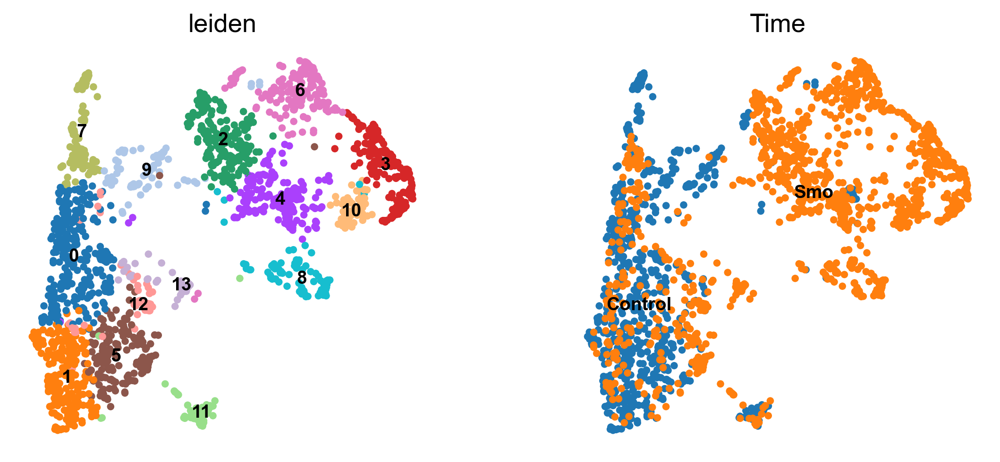

In [74]:
sc.pl.umap(adata_subset, color=['leiden','Time'], legend_loc='on data', legend_fontsize='10.0',
           frameon=False)

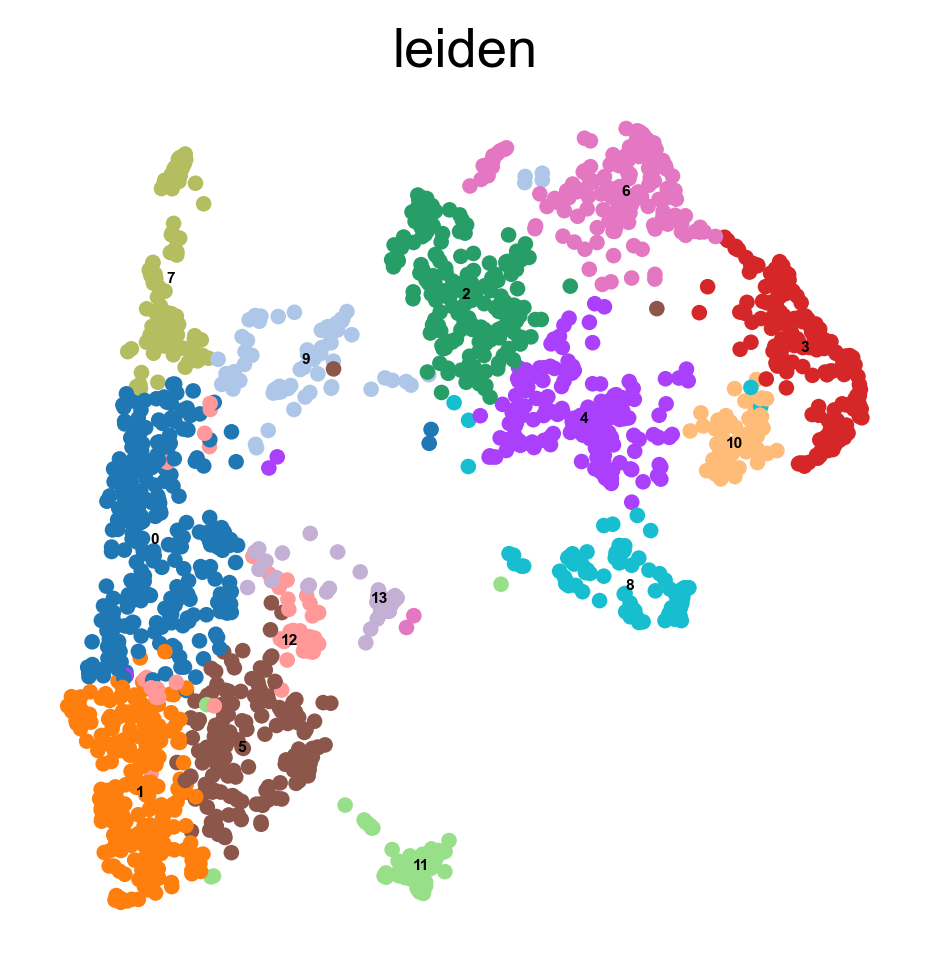

In [76]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='4.0',
           frameon=False)

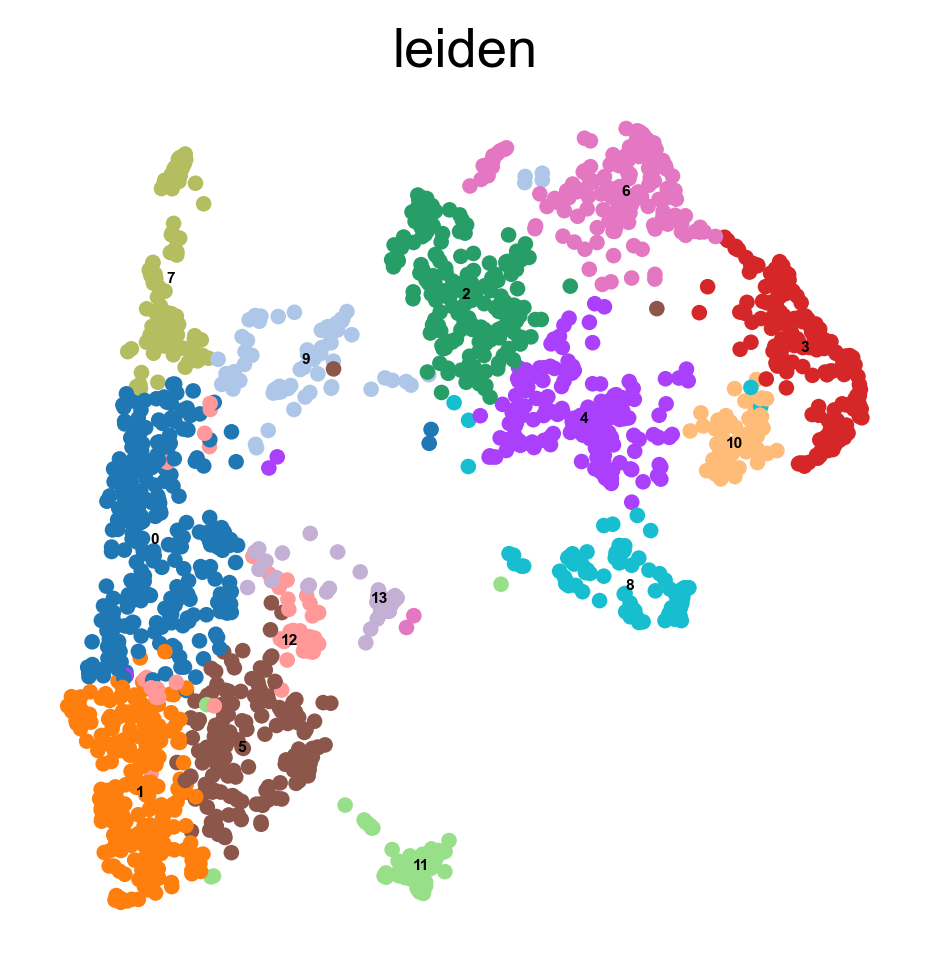

In [80]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='4.0',
           frameon=False)

In [87]:

###COLORING THE PLOT####

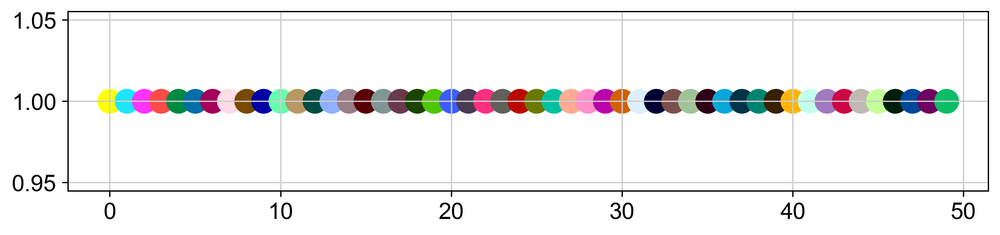

In [88]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(10, 2))
for i in range(50):
    pl.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=200)
pl.show()

In [145]:
default_colors = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_subset.uns['leiden_colors'])

In [146]:
print(new_colors)

['#CC0744' '#00846F' '#FF2F80' '#4FC601' '#1B4400' '#00846F' '#BA0900'
 '#CC0744' '#C0B9B2' '#6F0062' '#008941' '#C0B9B2' '#00846F' '#00846F']


In [147]:
new_colors[[0]] = default_colors[[43]]  # ''0 Crabp1 Acta2' 29
new_colors[[1]] = default_colors[[38]]  #  '1 Mmp3Mbp'
new_colors[[2]] = default_colors[[24]]  # '2 Penk' 22
new_colors[[3]] = default_colors[[19]]  # '3 PreDP' 18
new_colors[[4]] = default_colors[[18]]  # '4 Penk' 19
new_colors[[5]] = default_colors[[38]]  # '5 Dividing
new_colors[[6]] = default_colors[[22]]  # '5 Dividing 27
new_colors[[7]] = default_colors[[43]]  # '5 Dividing 43
new_colors[[8]] = default_colors[[44]]  # '5 Dividing
new_colors[[9]] = default_colors[[48]]  # '5 Dividing
new_colors[[10]] = default_colors[[4]]  # '5 Dividing
new_colors[[11]] = default_colors[[44]]  # '5 Dividing
new_colors[[12]] = default_colors[[38]]  # '5 Dividing
new_colors[[13]] = default_colors[[38]]  # '5 Dividing

In [148]:

adata_subset.uns['leiden_colors'] = new_colors

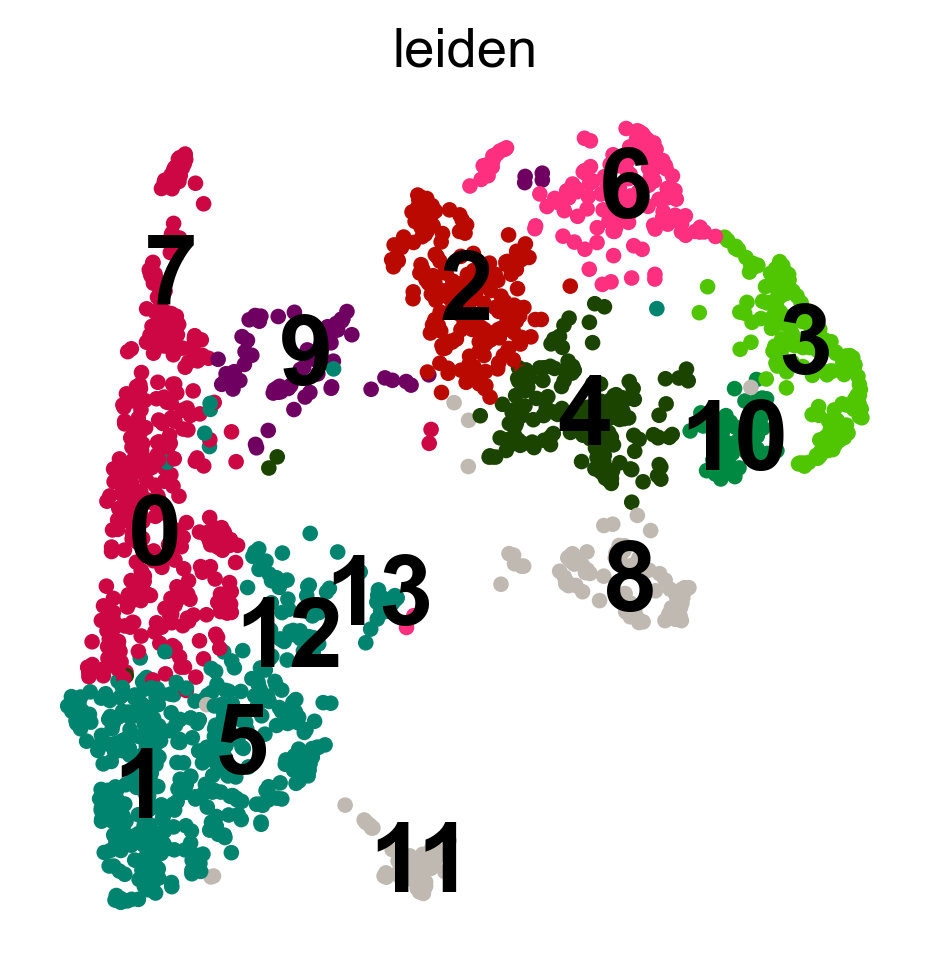

In [155]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='25.0',
           frameon=False)

In [151]:
adata_subset.uns['leiden_colors'] = new_colors

In [152]:
adata_subset

AnnData object with n_obs × n_vars = 1867 × 3430
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Time_colors', 'rank_genes_groups', 'smo_up'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

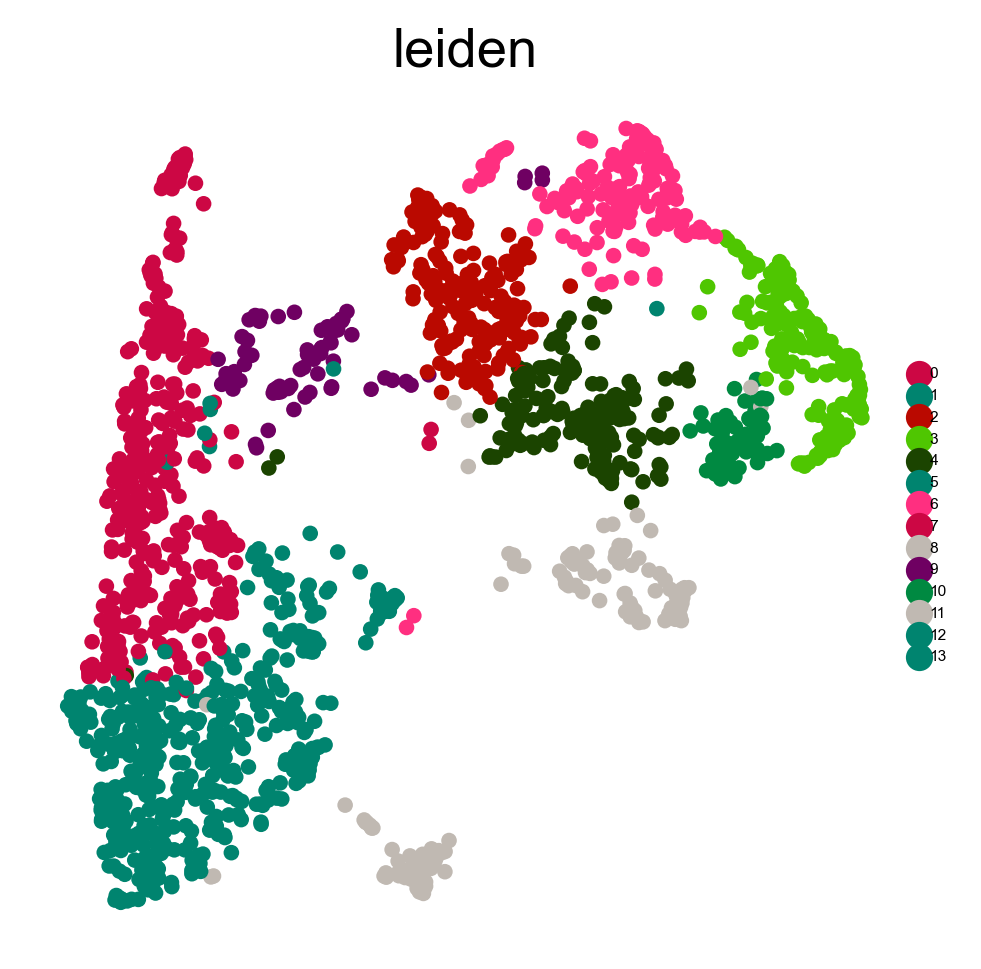

In [153]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='right margin', legend_fontsize='4.0',
           frameon=False)

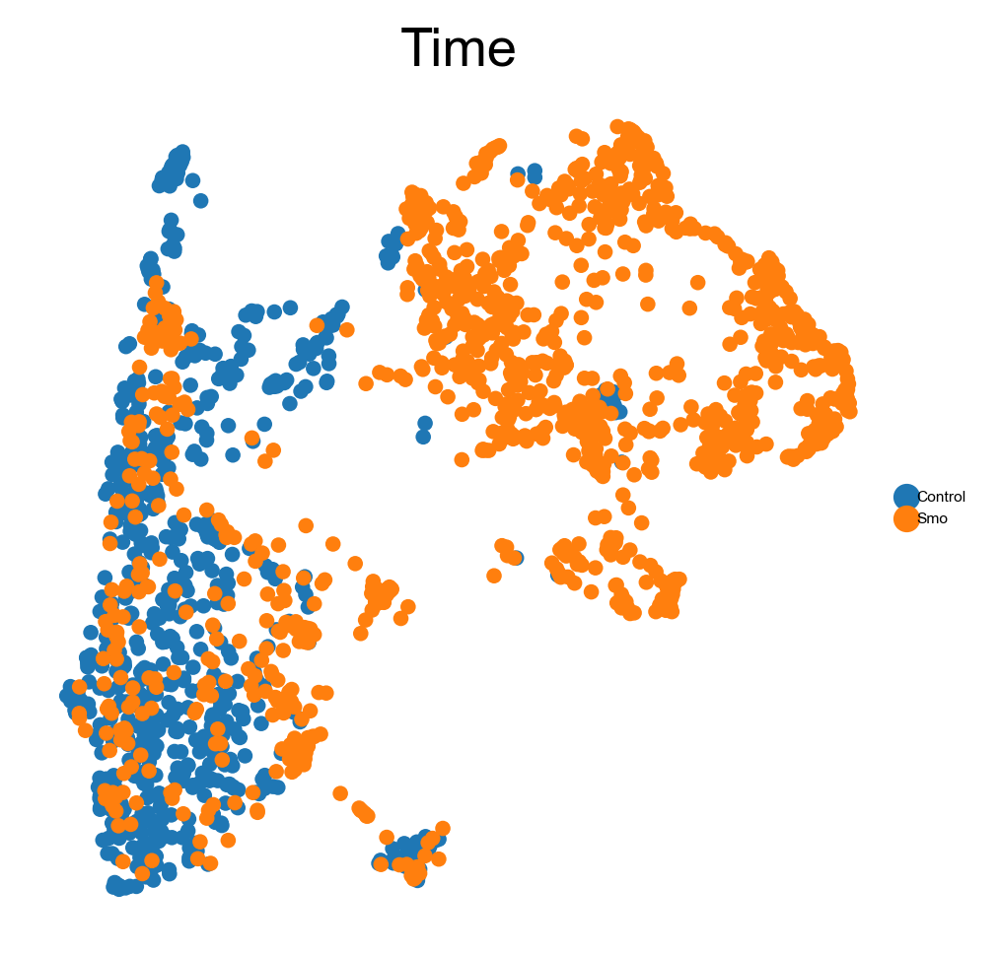

In [118]:
sc.pl.umap(adata_subset, color='Time', legend_loc='right margin', legend_fontsize='4.0',
           frameon=False)

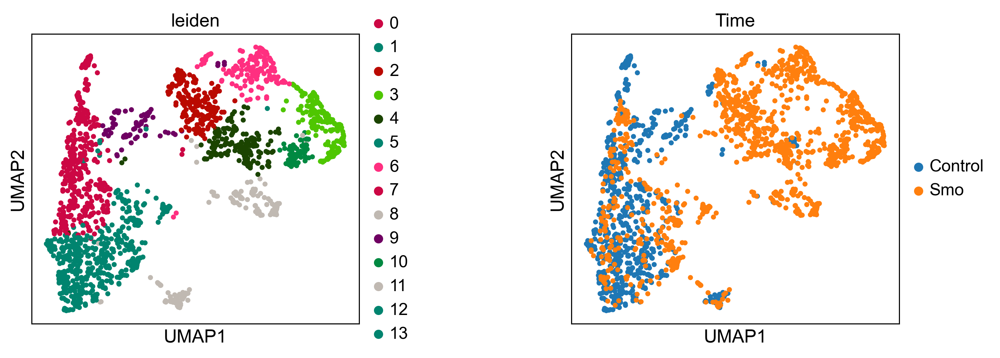

In [156]:
sc.pl.umap(adata_subset, color=['leiden','Time'], legend_loc='right margin', wspace=0.5, size=60)

In [154]:
adata_subset.obs.groupby(["leiden","Time"]).apply(len)

leiden  Time   
0       Control    201
        Smo         74
1       Control    182
        Smo         47
2       Control      9
        Smo        183
3       Smo        176
4       Control     11
        Smo        162
5       Control     91
        Smo         73
6       Smo        161
7       Control     78
        Smo         31
8       Control      3
        Smo         86
9       Control     60
        Smo         10
10      Smo         67
11      Control     33
        Smo         31
12      Control     23
        Smo         33
13      Control      3
        Smo         39
dtype: int64